# Project 4: West Nile Virus
---
#### 02. EDA and Feature Engineering

# Contents:
- [Library and data import](#Library-and-data-import)
- [Train Feature Engineering and EDA](#Train-Feature-Engineering-and-EDA)
- [Weather Feature Engineering and EDA](#Weather-Feature-Engineering-and-EDA)
- [Merged Feature Engineering and EDA](#Merged-Feature-Engineering-and-EDA)
- [Spray Feature Engineering and EDA](#Spray-Feature-Engineering-and-EDA)
- [Export as CSV](#Export-as-CSV)

## Summary of Features Explored & Engineered

#### Mosquito Species 

Preliminary research from NCBI has suggested that the ability of different mosquito species to acquire and transmit West Nile Virus (WNV) is highly variable. Culex mosquitoes are the dominant global transmission vector of WNV to humans; but their transmission rates among various species of the Culex genus may vary widely. As a result, it will be worth investigating which Culex mosquito species is the most dominant vector.

This factor is even more critical than metereological features in predicting WNV transmission.

#### Traps 

Analysis of spatial features such as traps and satellite traps will give us a clue about WNV transmission patterns because the infectious nature of the disease implies that clusters or locations which are adjacent to an already infected zone are more likely to get infected.

Duplicate data has also been found, which will be dropped.

#### Weather & metereological features 

Research on NCBI suggests that weather is an extremely important factor influencing the mosquito lifecycle, with infection and dissemination rates positively correlating with temperatures (especially above 77 degrees Fahrenheit).

NCBI research suggests that these weather factors are most pivotal in predicting mosquito growth and WNV transmission:
- Average temperature
- Temperature fluctuation (tmax-tmin)
- Light intensity (operationalized by daylight hours, sunset - sunrise)
- Relative humidity (formula explained)
- Rainfall/precipitation rates

Rainfall & precipitation rates are already included in the data and the rest will be engineered.

Next, lead & lag meterological features will be elucidated upon, and a correlation matrix will be plotted with all the features.

#### Spray data & Misc

After that, we analyse the spray data and merge them for modelling.

# Library and data import

In [1]:
# import libraries
import numpy as np
import pandas as pd
from itertools import combinations
from metpy.units import units
from metpy.calc import relative_humidity_from_dewpoint

import datetime

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates
import plotly.express as px
import plotly.graph_objects as go

pd.set_option("display.max_rows", 500)
pd.set_option("display.max_columns", 30)

# from mapbox.com
MAPBOX_TOKEN = "pk.eyJ1IjoibWFydmluZmp5IiwiYSI6ImNreXNyamkyZTE2YWwyb3Q4Z2d0dnloaG4ifQ.KNBXApYk18P2IP-m4-Vg5Q"

In [2]:
# import train_cleaned clean
train_cleaned = pd.read_csv("../output_data/train_clean.csv")

# import weather clean
weather_cleaned = pd.read_csv("../output_data/weather_clean.csv")

# import spray clean
spray_cleaned = pd.read_csv("../output_data/spray_clean.csv")

# Train Feature Engineering and EDA 

In [3]:
train_cleaned.head()

,date,species,trap,addressnumberandstreet,latitude,longitude,nummosquitos,wnvpresent
0,2007-05-29,PIPIENS/RESTUANS,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,1,0
1,2007-05-29,RESTUANS,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,1,0
2,2007-05-29,RESTUANS,T007,"6200 N MANDELL AVE, Chicago, IL",41.994991,-87.769279,1,0
3,2007-05-29,PIPIENS/RESTUANS,T015,"7900 W FOSTER AVE, Chicago, IL",41.974089,-87.824812,1,0
4,2007-05-29,RESTUANS,T015,"7900 W FOSTER AVE, Chicago, IL",41.974089,-87.824812,4,0


### Number of mosquitoes and species 

According to VCDI <sup>[(1)](https://www.vdci.net/vector-borne-diseases/west-nile-virus-education-and-mosquito-management-to-protect-public-health/#:~:text=West%20Nile%20virus%20is%20spread,feed%20from%20evening%20to%20morning.)</sup>, Culex Tarsalis is the main mosquito vector of WNV in the USA, and is capable of injecting the virus into a variety of mammalian and avian hosts. Culex pipiens and Culex Territans are also widely viewed as important mosquito vectors by the scientific community.


In fact, scientists view the mosquito species as a more important variable influencing WNV transmission compared to any other factor (eg. climate and weather). As a result, correct engineering of this feature is extremely pivotal.

In [4]:
# dataframe showing the total number of each species present,
# as well as frequency of WNV detected by species.
mosquitoes = (
    train_cleaned[["species", "nummosquitos", "wnvpresent"]]
    .groupby(by="species")
    .sum()
)
mosquitoes

,nummosquitos,wnvpresent
species,,
ERRATICUS,7,0
PIPIENS,44671,240
PIPIENS/RESTUANS,66268,262
RESTUANS,23431,49
SALINARIUS,145,0
TARSALIS,7,0
TERRITANS,510,0


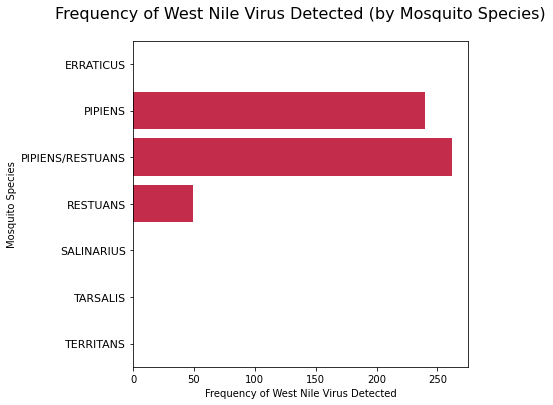

In [5]:
# Plotting a bar chart of frequency of WNV found per mosquito species.
mosquitoes = (
    train_cleaned[["species", "nummosquitos", "wnvpresent"]]
    .groupby(by="species")
    .sum()
    .reset_index()
)

plt.figure(figsize=(6, 6))
sns.barplot(
    data=mosquitoes,
    x=mosquitoes["wnvpresent"],
    y=mosquitoes["species"],
    color="crimson",
)

plt.title(
    "Frequency of West Nile Virus Detected (by Mosquito Species)",
    fontsize=16,
    y=1.05,
)

plt.xlabel("Frequency of West Nile Virus Detected")
plt.ylabel("Mosquito Species")
plt.yticks(fontsize=11)
plt.show()

Based on the chart above, even when Culex Tarsalis is the main mosquito vector of WNV in the USA, we have observed <b>nil WNV detected</b> from Tersalis in our `train_cleaned` dataset. This is also similar for Territans, which is also known to be an important mosquito vector. On the other hand, Restuans had a moderate WNV detection rate despite not being an important mosquito vector. Hence, we conclude that it would be more appropriate to do a <b>One-Hot-Encode</b> of mosquito species instead of giving an inaccurate ordinal ranking to the species based on our `train_cleaned` dataset alone.

### Traps and Satellite Traps
Satellite traps are additional traps set up near established traps to enhance surveillance efforts. The locations (longitude & latitude information) of these satellite traps are investigated below.

In [6]:
# find satellite traps
satellite_traps = set([i for i in train_cleaned["trap"] if len(i) > 4])
satellite_traps

{'T054C', 'T094B'}

In [7]:
# function to find euclidean distance between traps (in km)
# one unit is equivalent to 1 degree longitude/latitude, which is around 111km
def dist_btwn_traps(trap1, trap2):
    lat1, long1 = train_cleaned[train_cleaned["trap"] == trap1].iloc[0][
        ["latitude", "longitude"]
    ]

    lat2, long2 = train_cleaned[train_cleaned["trap"] == trap2].iloc[0][
        ["latitude", "longitude"]
    ]

    return ((lat1 - lat2) ** 2 + (long1 - long2) ** 2) ** 0.5 * 111


# distance between satellite traps and corresponding main traps
print(f"Trap T054: {round(dist_btwn_traps('T054', 'T054C'),5)} km")
print(f"Trap T094: {round(dist_btwn_traps('T094', 'T094B'),5)} km")

Trap T054: 0.44204 km
Trap T094: 0.43479 km


In [8]:
# create dataframe of all possible pairs of traps and distances between them
list_dist = []
traps = set(train_cleaned["trap"].values)

for combi in combinations(traps, 2):
    list_dist.append([combi[0], combi[1], dist_btwn_traps(combi[0], combi[1])])

df_dist = pd.DataFrame(
    list_dist, columns=["Trap1", "Trap2", "Distance"]
).sort_values("Distance")

In [9]:
df_dist.reset_index(drop=True, inplace=True)

In [10]:
# 10 furthest pairs of traps
df_dist[::-1][:10]

,Trap1,Trap2,Distance
9179,T221,T903,54.730405
9178,T212,T903,53.614591
9177,T903,T215,53.596671
9176,T221,T900,52.468837
9175,T903,T103,52.145424
9174,T100,T903,51.718487
9173,T200,T903,51.599273
9172,T212,T900,51.181256
9171,T215,T900,51.105627
9170,T903,T097,50.218931


In [11]:
# 10 nearest pairs of traps
df_dist[:10]

,Trap1,Trap2,Distance
0,T047,T088,0.107148
1,T007,T236,0.183125
2,T089,T085,0.285049
3,T003,T141,0.386987
4,T074,T157,0.408326
5,T094B,T094,0.434787
6,T054C,T054,0.442039
7,T107,T138,0.466087
8,T233,T016,0.506968
9,T206,T209,0.558004


### Dropping of duplicated information on Trap Location
The 2 satellite traps (T094B and T054C) are less than 500 metres away from their main traps (T094 and T054), but there are 5 other pairs of traps that are even closer to each other, with T047 and T088 being around 100 metres apart only.

It has been decided not to treat satellite traps as if they are at the location of the main trap.

Since `trap`, `addressnumberandstreet`, `latitude` and `longitude` tell us the location of the traps placed, we will only be using `latitude` and `longitude` because these two features would give us the coordinates as to where the traps were placed. Hence, we will be dropping the other two features.

In [12]:
# filter all columns related to location
train_cleaned_location = train_cleaned.drop(
    columns=["date", "species", "nummosquitos", "wnvpresent"]
)

# visualising location features
train_cleaned_location.value_counts().sort_index().head(20)

trap  addressnumberandstreet               latitude   longitude 
T001  4000  N TRIPP AVE, Chicago, IL       41.953705  -87.733974     15
T002  4100  N OAK PARK AVE, Chicago, IL    41.954690  -87.800991    185
T003  4600  N MILWAUKEE AVE, Chicago, IL   41.964242  -87.757639    122
T004  4900  W SUNNYSIDE AVE, Chicago, IL   41.962728  -87.748367     12
T005  6000  W ROSCOE ST, Chicago, IL       41.942114  -87.776385     14
T006  6000  N AVONDALE AVE, Chicago, IL    41.990284  -87.797127     24
T007  6200  N MANDELL AVE, Chicago, IL     41.994991  -87.769279     23
T008  7000  N MOSELL AVE, Chicago, IL      42.008314  -87.777921    139
T009  9100  W HIGGINS AVE, Chicago, IL     41.981964  -87.812827     31
      9100  W HIGGINS RD, Chicago, IL      41.992478  -87.862995     80
T011  3600  N PITTSBURGH AVE, Chicago, IL  41.944869  -87.832763    133
T012  6100  N LEMONT AVE, Chicago, IL      41.991429  -87.747113    105
T013  6100  W FULLERTON AVE, Chicago, IL   41.923738  -87.785288    104

In [13]:
# dropping 'trap' and 'addressnumberandstreet' from our train_cleaned dataset
train_cleaned.drop(columns=["trap", "addressnumberandstreet"], inplace=True)

# Weather Feature Engineering and EDA

In [14]:
weather_cleaned.head()

,station,date,tmax,tmin,tavg,depart,dewpoint,wetbulb,heat,cool,sunrise,sunset,preciptotal,stnpressure,sealevel,resultspeed,resultdir,avgspeed
0,1,2007-05-01,83,50,67.0,14.0,51,56.0,0.0,2.0,04:48,18:49,0.0,29.10,29.82,1.7,27,9.2
1,2,2007-05-01,84,52,68.0,14.0,51,57.0,0.0,3.0,04:48,18:49,0.0,29.18,29.82,2.7,25,9.6
2,1,2007-05-02,59,42,51.0,-3.0,42,47.0,14.0,0.0,04:47,18:50,0.0,29.38,30.09,13.0,4,13.4
3,2,2007-05-02,60,43,52.0,-3.0,42,47.0,13.0,0.0,04:47,18:50,0.0,29.44,30.08,13.3,2,13.4
4,1,2007-05-03,66,46,56.0,2.0,40,48.0,9.0,0.0,04:46,18:51,0.0,29.39,30.12,11.7,7,11.9


Research on NCBI suggests that weather is an extremely important factor influencing the mosquito lifecycle, with infection and dissemination rates positively correlating with temperatures (especially above 77 degrees Fahrenheit). The Koppen weather classification classifies Chicago as a hot summer humid continental.

I reiterate that the most important weather factors are:
- Average temperature
- Temperature fluctuation
- Light intensity
- Relative humidity
- Rainfall/precipitation rates

Because rainfall/precipitation rates are already present in the data, the rest will be engineered.


## Engineered weather features

### Temperature Fluctuation 

Most laboratory mosquito research appears to elucidate the relationship between a static temperature and mosquito vector growth rate/ WNV transmission rates. However, in reality, temperature is not perfectly controlled, and instead follows a stochastic pattern. There is insufficient data displaying the effect of a fluctuating or dynamic temperature system on WNV replication and transmission rates.

Instead, research regarding a closely related virus in the flavivirus family, Zika, found that as temperature fluctuations increases, it decreases the ability of mosquitos to transmit the virus. As a result, a variable measuring the fluctuation of temperature would be engineered. As climate change intensifies, the importance of this variable will heighten.

In [15]:
weather_cleaned["temp_fluct"] = (
    weather_cleaned["tmax"] - weather_cleaned["tmin"]
)

In [16]:
weather_cleaned.dtypes

station          int64
date            object
tmax             int64
tmin             int64
tavg           float64
depart         float64
dewpoint         int64
wetbulb        float64
heat           float64
cool           float64
sunrise         object
sunset          object
preciptotal    float64
stnpressure    float64
sealevel       float64
resultspeed    float64
resultdir        int64
avgspeed       float64
temp_fluct       int64
dtype: object

In [17]:
# create datetime feature - year, month, week, day
weather_cleaned["date"] = pd.to_datetime(weather_cleaned["date"])
weather_cleaned["year"] = weather_cleaned["date"].dt.year
weather_cleaned["mth_day"] = weather_cleaned["date"].dt.strftime("%m-%d")
weather_cleaned["week"] = (
    weather_cleaned["date"].dt.isocalendar().week.astype(int)
)

### Daylight hours/Light Intensity 

Research on NCBI shows that light intensity is also a critical factor to look at. The steps below show data preparation before engineering of the "daylight" variable as an approximation to light intensity, operationalized by sunset - sunrise. Although this variable shows colinearity with average temperature, laboratory mosquito research has successfully isolated the two, and proven that light intensity alone (independent of temperature increase) would increase important biological steps in the WNV transmission process.

In [18]:
# new feature - daylight minutes
weather_cleaned["daylight"] = (
    weather_cleaned["sunset"].astype("datetime64")
    - weather_cleaned["sunrise"].astype("datetime64")
).dt.seconds / 3600

### Relative Humidity 

It is common knowledge that humidity stimulates mosquito growth and transmission of diseases like Dengue and Malaria. A similar pattern is expected to be found for WNV.

In [19]:
# function to calculate relative humidity
def cal_rh(temp, dewpoint):
    rh = relative_humidity_from_dewpoint(
        temperature=temp * units.fahrenheit,
        dewpoint=dewpoint * units.fahrenheit,
    ).magnitude
    return rh


# new feature - relative_hum
weather_cleaned["relative_hum"] = weather_cleaned.apply(
    lambda x: cal_rh(x["tavg"], x["dewpoint"]), axis=1
)

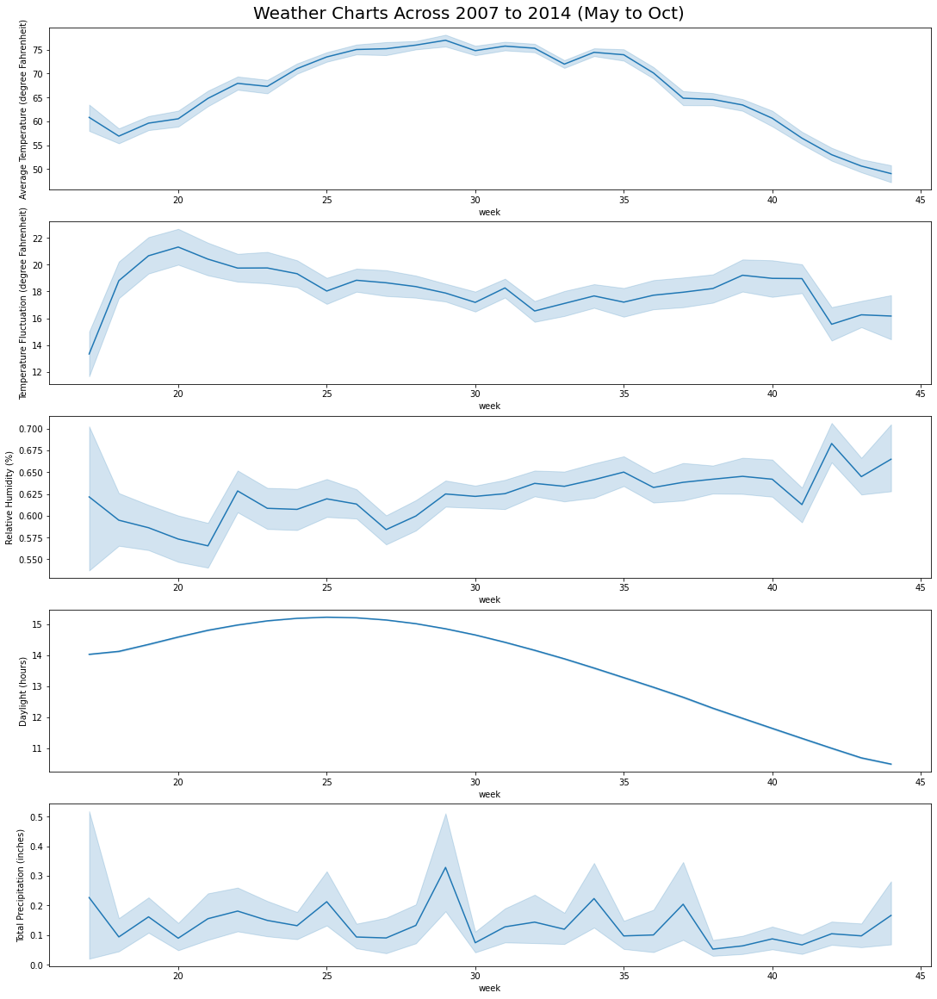

In [20]:
# plot weather charts using average across all years
fig, ax = plt.subplots(
    nrows=5, ncols=1, figsize=(15, 16), constrained_layout=True
)

# set title
fig.suptitle("Weather Charts Across 2007 to 2014 (May to Oct)", fontsize=20)

# plt each feature agaist time
sns.lineplot(data=weather_cleaned, x="week", y="tavg", ax=ax[0])
sns.lineplot(data=weather_cleaned, x="week", y="temp_fluct", ax=ax[1])
sns.lineplot(data=weather_cleaned, x="week", y="relative_hum", ax=ax[2])
sns.lineplot(data=weather_cleaned, x="week", y="daylight", ax=ax[3])
sns.lineplot(data=weather_cleaned, x="week", y="preciptotal", ax=ax[4])

# set label
ax[0].set_ylabel("Average Temperature (degree Fahrenheit)")
ax[1].set_ylabel("Temperature Fluctuation (degree Fahrenheit)")
ax[2].set_ylabel("Relative Humidity (%)")
ax[3].set_ylabel("Daylight (hours)")
ax[4].set_ylabel("Total Precipitation (inches)")

plt.show()

Analysis of the meterological features of Chciago show that temperature peaks around week 30 at almost 80 degrees Farenheit. Daylight hours peak at week 25 at greater than 15 hours.

Relative humidity showed a very mild upward trend across the weeks, with an extremely high volatility. Temperature fluctuation also showed a very high level of volatility.

Weeks 30-38 stood out as weeks with the highest level of precipitation (rainfall).

In [21]:
# create function for plotting
def plot_func(dataframe, attr, **kwarg):
    """Plot histogram, scatter plot, box plot, and qq plot in a figure."""
    row = len(attr)
    col = 3
    figsize = (20, row * 4)
    fig, ax = plt.subplots(
        nrows=row, ncols=col, figsize=figsize, constrained_layout=True
    )
    for x in range(row):

        # histogram plot
        sns.histplot(x=attr[x], data=dataframe, ax=ax[x, 0], color="tab:red")
        ax[x, 0].set_title(f"histogram: {attr[x]}")
        ax[x, 0].tick_params(labelrotation=90, axis="x")

        # scatter plot
        sns.scatterplot(
            x="week",
            y=attr[x],
            data=dataframe,
            color="tab:orange",
            ax=ax[x, 1],
        )
        ax[x, 1].set_title(f"scatter plot: {attr[x]}")
        ax[x, 1].tick_params(labelrotation=90, axis="x")

        # box plot
        sns.boxplot(x=attr[x], data=dataframe, ax=ax[x, 2])
        sns.stripplot(x=attr[x], data=dataframe, ax=ax[x, 2], alpha=0.2)
        ax[x, 2].set_title(f"boxplot: {attr[x]}")
        ax[x, 2].tick_params(labelrotation=90, axis="x")

    plt.show()

In [22]:
# define list of numerical features
num_features = weather_cleaned.select_dtypes(
    include="number"
).columns.to_list()

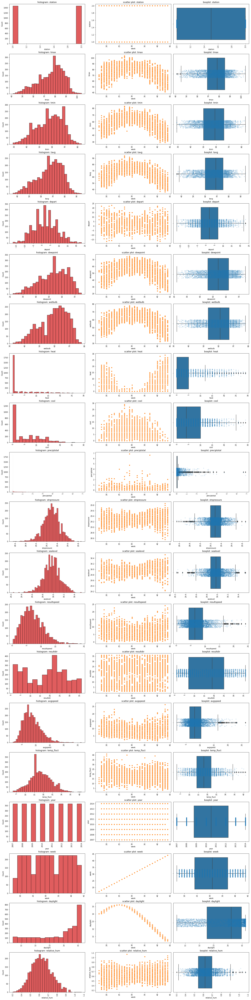

In [23]:
# plot features distribution
plot_func(weather_cleaned, num_features)

The distribution of meterological features are plotted here for further analysis. Most of these features (eg. Tmax, Tmin, Wetbulb, Dewpoint, heat, cool, preciptotal) show a strong right or left skew and are not normally distributed.

# Merged feature engineering and EDA

This section merges all the data in preparation for modelling and analysis. Final data checking is done (eg. printing out .info()) to check for whether there are any null values.

In [24]:
# check shape of dataframe
weather_cleaned.shape

(2944, 24)

In [25]:
# update data type
train_cleaned["date"] = pd.to_datetime(train_cleaned["date"])

In [26]:
train_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10506 entries, 0 to 10505
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          10506 non-null  datetime64[ns]
 1   species       10506 non-null  object        
 2   latitude      10506 non-null  float64       
 3   longitude     10506 non-null  float64       
 4   nummosquitos  10506 non-null  int64         
 5   wnvpresent    10506 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(2), object(1)
memory usage: 492.6+ KB


In [27]:
merged = train_cleaned.merge(
    weather_cleaned.groupby("date").mean(), on="date", how="left"
)
merged.head()

,date,species,latitude,longitude,nummosquitos,wnvpresent,station,tmax,tmin,tavg,depart,dewpoint,wetbulb,heat,cool,preciptotal,stnpressure,sealevel,resultspeed,resultdir,avgspeed,temp_fluct,year,week,daylight,relative_hum
0,2007-05-29,PIPIENS/RESTUANS,41.954690,-87.800991,1,0,1.5,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,0.0,29.415,30.1,5.8,17.0,6.95,25.5,2007.0,22.0,14.933333,0.55584
1,2007-05-29,RESTUANS,41.954690,-87.800991,1,0,1.5,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,0.0,29.415,30.1,5.8,17.0,6.95,25.5,2007.0,22.0,14.933333,0.55584
2,2007-05-29,RESTUANS,41.994991,-87.769279,1,0,1.5,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,0.0,29.415,30.1,5.8,17.0,6.95,25.5,2007.0,22.0,14.933333,0.55584
3,2007-05-29,PIPIENS/RESTUANS,41.974089,-87.824812,1,0,1.5,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,0.0,29.415,30.1,5.8,17.0,6.95,25.5,2007.0,22.0,14.933333,0.55584
4,2007-05-29,RESTUANS,41.974089,-87.824812,4,0,1.5,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,0.0,29.415,30.1,5.8,17.0,6.95,25.5,2007.0,22.0,14.933333,0.55584


In [28]:
merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10506 entries, 0 to 10505
Data columns (total 26 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          10506 non-null  datetime64[ns]
 1   species       10506 non-null  object        
 2   latitude      10506 non-null  float64       
 3   longitude     10506 non-null  float64       
 4   nummosquitos  10506 non-null  int64         
 5   wnvpresent    10506 non-null  int64         
 6   station       10506 non-null  float64       
 7   tmax          10506 non-null  float64       
 8   tmin          10506 non-null  float64       
 9   tavg          10506 non-null  float64       
 10  depart        10506 non-null  float64       
 11  dewpoint      10506 non-null  float64       
 12  wetbulb       10506 non-null  float64       
 13  heat          10506 non-null  float64       
 14  cool          10506 non-null  float64       
 15  preciptotal   10506 non-null  float6

## Lag/ lead indicators for WNV

Analysis from this section showed that precipitation & temperature are leading indicators, while WNV occurrences are extremely responsive to changes in relative humidity from week 31-37.

In [29]:
merged.columns

Index(['date', 'species', 'latitude', 'longitude', 'nummosquitos',
       'wnvpresent', 'station', 'tmax', 'tmin', 'tavg', 'depart', 'dewpoint',
       'wetbulb', 'heat', 'cool', 'preciptotal', 'stnpressure', 'sealevel',
       'resultspeed', 'resultdir', 'avgspeed', 'temp_fluct', 'year', 'week',
       'daylight', 'relative_hum'],
      dtype='object')

In [30]:
merged.head()

,date,species,latitude,longitude,nummosquitos,wnvpresent,station,tmax,tmin,tavg,depart,dewpoint,wetbulb,heat,cool,preciptotal,stnpressure,sealevel,resultspeed,resultdir,avgspeed,temp_fluct,year,week,daylight,relative_hum
0,2007-05-29,PIPIENS/RESTUANS,41.954690,-87.800991,1,0,1.5,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,0.0,29.415,30.1,5.8,17.0,6.95,25.5,2007.0,22.0,14.933333,0.55584
1,2007-05-29,RESTUANS,41.954690,-87.800991,1,0,1.5,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,0.0,29.415,30.1,5.8,17.0,6.95,25.5,2007.0,22.0,14.933333,0.55584
2,2007-05-29,RESTUANS,41.994991,-87.769279,1,0,1.5,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,0.0,29.415,30.1,5.8,17.0,6.95,25.5,2007.0,22.0,14.933333,0.55584
3,2007-05-29,PIPIENS/RESTUANS,41.974089,-87.824812,1,0,1.5,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,0.0,29.415,30.1,5.8,17.0,6.95,25.5,2007.0,22.0,14.933333,0.55584
4,2007-05-29,RESTUANS,41.974089,-87.824812,4,0,1.5,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,0.0,29.415,30.1,5.8,17.0,6.95,25.5,2007.0,22.0,14.933333,0.55584


In [31]:
def plot_wnv_indicator(df, x_attr, y_attr, y_axis_label, title):
    """plot input predictors with wnv detection agaist time"""

    fig, ax = plt.subplots(figsize=(12, 5))
    ax0 = ax.twinx()  # creating 2nd y-axis
    sns.lineplot(
        data=df, x=x_attr, y=y_attr, palette="coolwarm", ax=ax, label=y_attr
    )
    sns.lineplot(
        data=df,
        x=x_attr,
        y="wnvpresent",
        color="tab:orange",
        ax=ax0,
        label="wnvpresent",
    )

    ax.legend(
        loc="lower left",
        bbox_to_anchor=(0.0, 1.01),
        borderaxespad=0,
        frameon=False,
    )
    ax.set_title(title, fontsize=16)
    ax.set_xlabel("Week", fontsize=14)
    ax.set_ylabel(y_axis_label, fontsize=14, color="tab:blue")
    ax.tick_params(axis="y", labelcolor="tab:blue")

    ax0.legend(
        loc="lower left",
        bbox_to_anchor=(0.15, 1.01),
        borderaxespad=0,
        frameon=False,
    )
    ax0.set_ylabel("WNV occurrences", fontsize=14, color="tab:orange")
    ax0.tick_params(axis="y", labelcolor="tab:orange")
    fig.tight_layout()
    plt.show()
    return

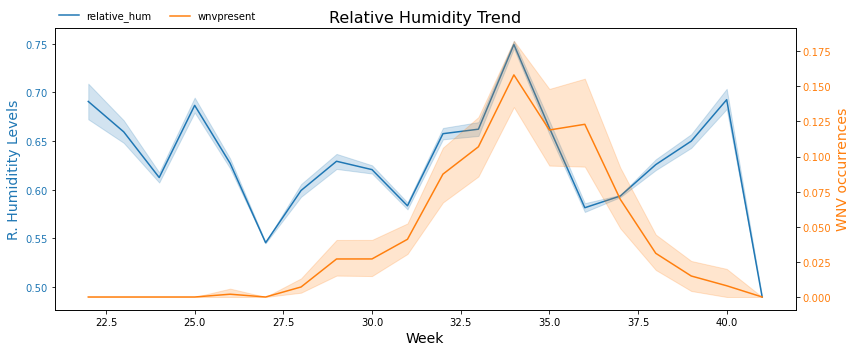

In [32]:
plot_wnv_indicator(
    df=merged,
    x_attr="week",
    y_attr="relative_hum",
    y_axis_label="R. Humiditity Levels",
    title="Relative Humidity Trend",
)

Relative humidity dropped at 27.5 before increasing again, peaking at week 34. WNV occurrences only showed a direct relationship with relative humidity between week 31-37. This suggests that WNV occurrences are extremely responsive to relative humidity from week 31-37 -a change in relative humidity almost immediately results in a change of WNV transmission.

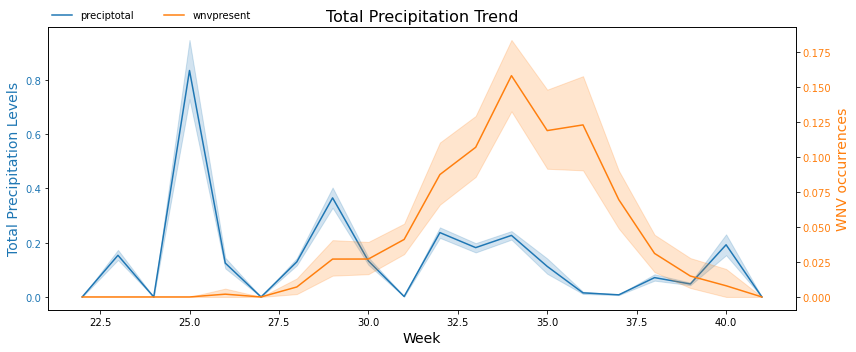

In [33]:
plot_wnv_indicator(
    df=merged,
    x_attr="week",
    y_attr="preciptotal",
    y_axis_label="Total Precipitation Levels",
    title="Total Precipitation Trend",
)

Precipitation levels may be a leading indicator because the peak in precipitation (week 27.5) occurred 2.5 weeks before the gradual increase in WNV occurrences from week 27.5-35.0.

However, there was a spike in precipitation at week 25.0 but there may be other confounding factors such as temperature that do not generate an increase in WNV occurrences.

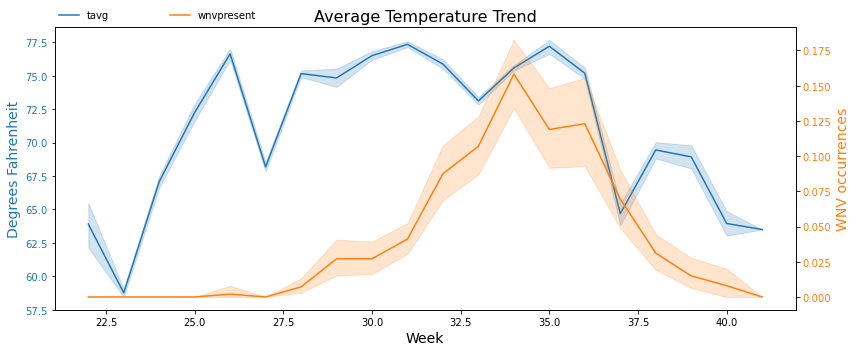

In [34]:
plot_wnv_indicator(
    df=merged,
    x_attr="week",
    y_attr="tavg",
    y_axis_label="Degrees Fahrenheit",
    title="Average Temperature Trend",
)

Average temperature also appears to be a leading indicator for WNV occurrences - the gradual increase in temperature occurred 8 weeks prior to the increase in WNV occurrences. This data suggests that average temperature and precipitation interact to generate an increase in WNV occurrences.

Note that the synergy between humidity, temperature & precipitation factors are important - temperature increase alone or precipitation increase alone DO NOT generate an increase in WNV occurrences.

In [35]:
# creating features based on weekly average
merged_groupby = merged.groupby("week").mean()
merged_groupby.reset_index(inplace=True)

In [36]:
merged_groupby.head()

,week,latitude,longitude,nummosquitos,wnvpresent,station,tmax,tmin,tavg,depart,dewpoint,wetbulb,heat,cool,preciptotal,stnpressure,sealevel,resultspeed,resultdir,avgspeed,temp_fluct,year,daylight,relative_hum
0,22.0,41.843323,-87.688444,2.738095,0.000000,1.5,70.440476,56.880952,63.910714,-0.535714,53.232143,57.422619,4.214286,3.125000,0.000000,29.183214,29.857679,6.502381,25.779762,7.827976,13.559524,2008.404762,14.921627,0.690750
1,23.0,41.866564,-87.725852,5.702350,0.000000,1.5,67.853786,49.278068,58.766319,-7.219321,46.933420,52.667102,6.233681,0.000000,0.153603,29.256828,29.945352,7.259661,7.417755,8.293734,18.575718,2009.814621,15.092080,0.659512
2,24.0,41.866494,-87.719618,11.538941,0.000000,1.5,77.507788,56.305296,67.073209,-1.448598,53.232087,58.920561,1.014019,3.087227,0.000000,29.269361,29.942477,5.586449,6.123053,6.903115,21.202492,2011.174455,15.200727,0.612575
3,25.0,41.856067,-87.710626,9.671687,0.000000,1.5,79.990964,64.203313,72.254518,1.412651,61.204819,64.814759,0.274096,7.528614,0.835120,29.186190,29.861355,7.586145,20.496988,9.619578,15.787651,2010.945783,15.230120,0.686747
4,26.0,41.875854,-87.735953,13.047619,0.001984,1.5,86.455357,66.326389,76.631944,4.573413,62.811508,67.551587,0.136905,11.768849,0.124851,29.220595,29.892331,7.343254,16.193452,8.457540,20.128968,2009.988095,15.210880,0.627176


In [37]:
# renaming features based as weekly average
merged_groupby.rename(
    columns={
        "tavg": "tavg_weekly",
        "relative_hum": "relative_hum_weekly",
        "preciptotal": "preciptotal_weekly",
    },
    inplace=True,
)

In [38]:
# merge new features with previous dataframe
merged = merged.merge(
    merged_groupby[
        ["week", "tavg_weekly", "relative_hum_weekly", "preciptotal_weekly"]
    ],
    on="week",
)

Average monthly temperature for the month of May (i.e. month in which week 20 & 21 falls under) from 2007-2014.

Source: https://www.weather.gov/wrh/Climate?wfo=lot
![](../assets/may_tavg.png)

In [39]:
def temp_lag(df, row, n):
    """function to return n number of pervious weeks data"""
    # Getting average temperature one week before
    week = row["week"]

    # Calculating average temperature for up to n-weeks before
    for i in range(n):
        try:
            row[f"tavg_weekly_lag{i+1}"] = df[df["week"] == (week - (i + 1))][
                "tavg_weekly"
            ].unique()[0]

        # For the first n weeks of with no records in csv, impute with
        # 60.7 deg Fehrenheit based on NOAA records
        except IndexError:
            row[f"tavg_weekly_lag{i+1}"] = 60.7
    return row

In [40]:
def relative_hum_lag(df, row, n):
    """function to return n number of pervious weeks data"""
    # Getting average relative humidity one week before
    week = row["week"]

    # Calculating average relative humidity for up to n-weeks before
    for i in range(n):
        try:
            row[f"relative_hum_weekly_lag{i+1}"] = df[
                df["week"] == (week - (i + 1))
            ]["relative_hum_weekly"].unique()[0]

        # For the first n weeks of with no records in csv, impute with
        # mean of relative humidity
        except IndexError:
            row[f"relative_hum_weekly_lag{i+1}"] = df["relative_hum"].mean()
    return row

Average monthly precipitaion for the month of May (i.e. month in which week 20 & 21 falls under) from 2007-2014.

Source: https://www.weather.gov/wrh/Climate?wfo=lot
![](../assets/may_precip.png)

In [41]:
def preciptotal_lag(df, row, n):
    """function to return n number of pervious weeks data"""
    # Getting average preciptotal one week before
    week = row["week"]

    # Calculating average preciptotal for up to n-weeks before
    for i in range(n):
        try:
            row[f"preciptotal_weekly_lag{i+1}"] = df[
                df["week"] == (week - (i + 1))
            ]["preciptotal_weekly"].unique()[0]

        # For the first n weeks of with no records in csv, impute with
        # 15% based on NOAA records
        except IndexError:
            row[f"preciptotal_weekly_lag{i+1}"] = 0.15
    return row

In [42]:
# create lag features up to 2 weeks
merged = merged.apply(lambda x: temp_lag(merged, x, 2), axis=1)
merged = merged.apply(lambda x: relative_hum_lag(merged, x, 2), axis=1)
merged = merged.apply(lambda x: preciptotal_lag(merged, x, 2), axis=1)

In [43]:
# inspect new merged df
merged[merged["year"] == 2007].head(100)

,date,species,latitude,longitude,nummosquitos,wnvpresent,station,tmax,tmin,tavg,depart,dewpoint,wetbulb,heat,cool,...,avgspeed,temp_fluct,year,week,daylight,relative_hum,tavg_weekly,relative_hum_weekly,preciptotal_weekly,tavg_weekly_lag1,tavg_weekly_lag2,relative_hum_weekly_lag1,relative_hum_weekly_lag2,preciptotal_weekly_lag1,preciptotal_weekly_lag2
0,2007-05-29,PIPIENS/RESTUANS,41.954690,-87.800991,1,0,1.5,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,...,6.95,25.5,2007.0,22.0,14.933333,0.555840,63.910714,0.690750,0.000000,60.700000,60.700000,0.635694,0.635694,0.15000,0.15
1,2007-05-29,RESTUANS,41.954690,-87.800991,1,0,1.5,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,...,6.95,25.5,2007.0,22.0,14.933333,0.555840,63.910714,0.690750,0.000000,60.700000,60.700000,0.635694,0.635694,0.15000,0.15
2,2007-05-29,RESTUANS,41.994991,-87.769279,1,0,1.5,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,...,6.95,25.5,2007.0,22.0,14.933333,0.555840,63.910714,0.690750,0.000000,60.700000,60.700000,0.635694,0.635694,0.15000,0.15
3,2007-05-29,PIPIENS/RESTUANS,41.974089,-87.824812,1,0,1.5,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,...,6.95,25.5,2007.0,22.0,14.933333,0.555840,63.910714,0.690750,0.000000,60.700000,60.700000,0.635694,0.635694,0.15000,0.15
4,2007-05-29,RESTUANS,41.974089,-87.824812,4,0,1.5,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,...,6.95,25.5,2007.0,22.0,14.933333,0.555840,63.910714,0.690750,0.000000,60.700000,60.700000,0.635694,0.635694,0.15000,0.15
5,2007-05-29,RESTUANS,41.921600,-87.666455,2,0,1.5,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,...,6.95,25.5,2007.0,22.0,14.933333,0.555840,63.910714,0.690750,0.000000,60.700000,60.700000,0.635694,0.635694,0.15000,0.15
6,2007-05-29,RESTUANS,41.891118,-87.654491,1,0,1.5,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,...,6.95,25.5,2007.0,22.0,14.933333,0.555840,63.910714,0.690750,0.000000,60.700000,60.700000,0.635694,0.635694,0.15000,0.15
7,2007-05-29,PIPIENS/RESTUANS,41.867108,-87.654224,1,0,1.5,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,...,6.95,25.5,2007.0,22.0,14.933333,0.555840,63.910714,0.690750,0.000000,60.700000,60.700000,0.635694,0.635694,0.15000,0.15
8,2007-05-29,RESTUANS,41.867108,-87.654224,2,0,1.5,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,...,6.95,25.5,2007.0,22.0,14.933333,0.555840,63.910714,0.690750,0.000000,60.700000,60.700000,0.635694,0.635694,0.15000,0.15
9,2007-05-29,RESTUANS,41.896282,-87.655232,1,0,1.5,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,...,6.95,25.5,2007.0,22.0,14.933333,0.555840,63.910714,0.690750,0.000000,60.700000,60.700000,0.635694,0.635694,0.15000,0.15


In [44]:
# plot correlation heatmap
def plot_heatmap(dataframe):
    plt.figure(figsize=(20, 20))
    corr = dataframe.corr()

    # Set up mask to be "True" in the upper triangle.
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask)] = True

    # Generate heatmap
    sns.heatmap(
        corr,
        mask=mask,
        cmap=sns.color_palette("RdBu_r", 7),
        annot=True,
        fmt=".2f",
        cbar_kws={"shrink": 0.5},
        square=True,
        linewidths=0.1,
        vmin=-1,
        vmax=1,
    )
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.show()

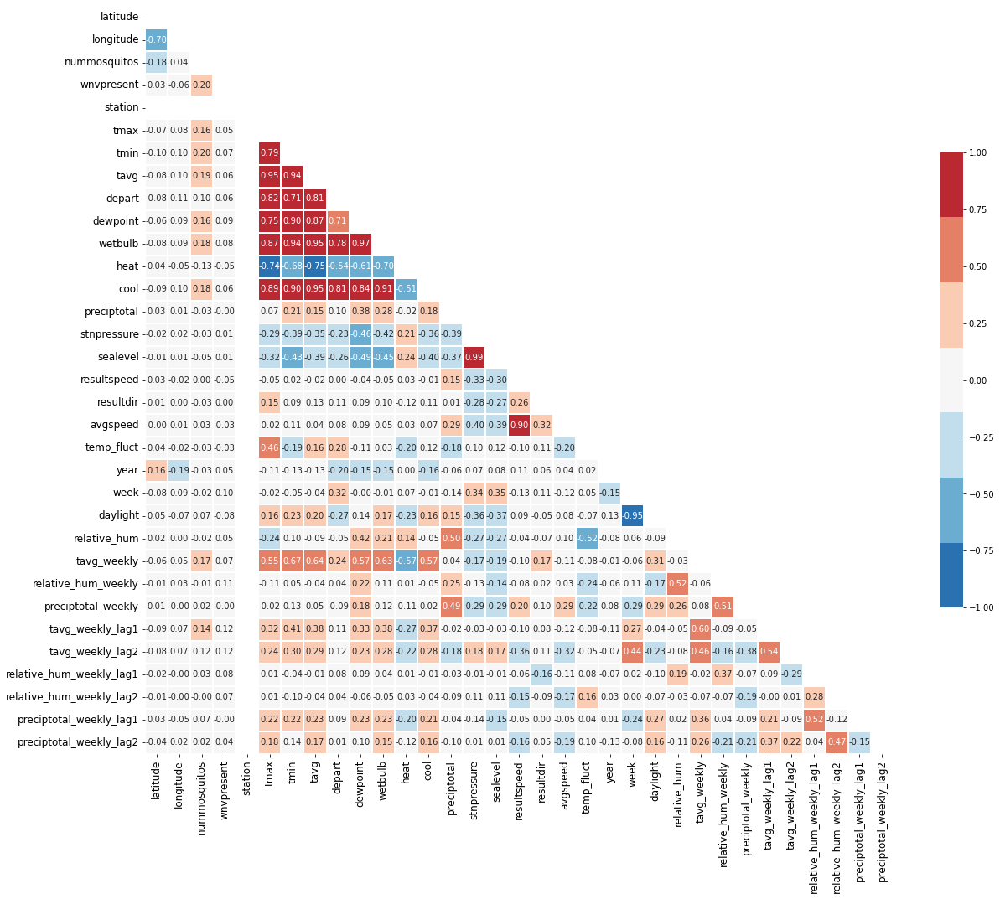

In [45]:
plot_heatmap(merged)

In [46]:
# top 15 features correlated to dependent variable
merged.corr()["wnvpresent"].sort_values(ascending=False).head(15)

wnvpresent                  1.000000
nummosquitos                0.196820
tavg_weekly_lag1            0.121657
tavg_weekly_lag2            0.120449
relative_hum_weekly         0.108604
week                        0.104171
dewpoint                    0.085883
relative_hum_weekly_lag1    0.080945
wetbulb                     0.080468
tmin                        0.074048
tavg_weekly                 0.069917
relative_hum_weekly_lag2    0.069156
tavg                        0.064256
cool                        0.058101
depart                      0.055436
Name: wnvpresent, dtype: float64

Correlations between features and wnv present were generally low (less than 0.2). Nummosquitoes was the most strongly correlated feature with WNV present but they are not present in the train dataset and will be dropped.

# Spray Feature Engineering and EDA

In [47]:
spray_cleaned.head()

,date,time,latitude,longitude
0,2011-08-29,6:56:58 PM,42.391623,-88.089163
1,2011-08-29,6:57:08 PM,42.391348,-88.089163
2,2011-08-29,6:57:18 PM,42.391022,-88.089157
3,2011-08-29,6:57:28 PM,42.390637,-88.089158
4,2011-08-29,6:57:38 PM,42.390410,-88.088858


In [48]:
spray_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14294 entries, 0 to 14293
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   date       14294 non-null  object 
 1   time       13710 non-null  object 
 2   latitude   14294 non-null  float64
 3   longitude  14294 non-null  float64
dtypes: float64(2), object(2)
memory usage: 446.8+ KB


Noted that `time` has some null values. Given that our observations will only be looking at the year, month, day and not scoping into the hours, minutes and seconds of when the sprays were conducted, we propose to drop this column.

In [49]:
# drop 'time'
spray_cleaned.drop(columns=["time"], inplace=True)

In [50]:
# change to date-time data type
spray_cleaned["date"] = pd.to_datetime(spray_cleaned["date"])

# create new df based on year
spray_2011 = spray_cleaned[spray_cleaned["date"].dt.year == 2011]
spray_2013 = spray_cleaned[spray_cleaned["date"].dt.year == 2013]

In [51]:
px.set_mapbox_access_token(MAPBOX_TOKEN)
fig = px.scatter_mapbox(
    merged[merged["year"] == 2011],
    lat="latitude",
    lon="longitude",
    size_max=20,
    zoom=10,
)
fig2 = px.scatter_mapbox(
    spray_2011,
    lat="latitude",
    lon="longitude",
    size_max=15,
    zoom=10,
    color_discrete_sequence=["#FF6692"],
    opacity=0.1,
    hover_data=["date"],
)
fig3 = px.scatter_mapbox(
    spray_2013,
    lat="latitude",
    lon="longitude",
    size_max=15,
    zoom=10,
    color_discrete_sequence=["#B6E880"],
    opacity=0.1,
    hover_data=["date"],
)

fig.add_trace(fig2.data[0])  # adds fig2 to the first figure
fig.add_trace(fig3.data[0])  # adds fig3 to the first figure

fig.update_layout(
    title="Traps in 2011 & Sprays in 2011 & 2013",
    autosize=False,
    width=900,
    height=700,
)


fig.show()

In [52]:
fig = px.scatter_mapbox(
    merged[merged["year"] == 2013],
    lat="latitude",
    lon="longitude",
    size_max=20,
    zoom=10,
    color_discrete_sequence=["red"],
)
fig2 = px.scatter_mapbox(
    spray_2011,
    lat="latitude",
    lon="longitude",
    size_max=15,
    zoom=10,
    color_discrete_sequence=["#FF6692"],
    opacity=0.1,
    hover_data=["date"],
)
fig3 = px.scatter_mapbox(
    spray_2013,
    lat="latitude",
    lon="longitude",
    size_max=15,
    zoom=10,
    color_discrete_sequence=["#B6E880"],
    opacity=0.1,
    hover_data=["date"],
)

fig.add_trace(fig2.data[0])  # adds fig2 to the first figure
fig.add_trace(fig3.data[0])  # adds fig3 to the first figure

fig.update_layout(
    title="Traps in 2013 & Sprays in 2011 & 2013",
    autosize=False,
    width=900,
    height=700,
)


fig.show()

# Export as CSV

In [53]:
# dropping unnecessary columns not related to temperature or humidity
merged.drop(
    columns=[
        "station",
        "resultspeed",
        "resultdir",
        "avgspeed",
        "stnpressure",
        "sealevel",
        "year",
        "week",
    ],
    inplace=True,
)

In [54]:
# dropping 'nummosquitos' as it isn't present within test data
merged.drop(columns=["nummosquitos"], inplace=True)
merged.head()

,date,species,latitude,longitude,wnvpresent,tmax,tmin,tavg,depart,dewpoint,wetbulb,heat,cool,preciptotal,temp_fluct,daylight,relative_hum,tavg_weekly,relative_hum_weekly,preciptotal_weekly,tavg_weekly_lag1,tavg_weekly_lag2,relative_hum_weekly_lag1,relative_hum_weekly_lag2,preciptotal_weekly_lag1,preciptotal_weekly_lag2
0,2007-05-29,PIPIENS/RESTUANS,41.954690,-87.800991,0,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,0.0,25.5,14.933333,0.55584,63.910714,0.69075,0.0,60.7,60.7,0.635694,0.635694,0.15,0.15
1,2007-05-29,RESTUANS,41.954690,-87.800991,0,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,0.0,25.5,14.933333,0.55584,63.910714,0.69075,0.0,60.7,60.7,0.635694,0.635694,0.15,0.15
2,2007-05-29,RESTUANS,41.994991,-87.769279,0,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,0.0,25.5,14.933333,0.55584,63.910714,0.69075,0.0,60.7,60.7,0.635694,0.635694,0.15,0.15
3,2007-05-29,PIPIENS/RESTUANS,41.974089,-87.824812,0,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,0.0,25.5,14.933333,0.55584,63.910714,0.69075,0.0,60.7,60.7,0.635694,0.635694,0.15,0.15
4,2007-05-29,RESTUANS,41.974089,-87.824812,0,88.0,62.5,75.5,10.0,58.5,65.5,0.0,10.5,0.0,25.5,14.933333,0.55584,63.910714,0.69075,0.0,60.7,60.7,0.635694,0.635694,0.15,0.15


In [55]:
merged.to_csv("../output_data/merged_train.csv", index=False)

In [56]:
# save a final copy of weather data for combining with test dataset in generating predictions
weather_cleaned.head()

,station,date,tmax,tmin,tavg,depart,dewpoint,wetbulb,heat,cool,sunrise,sunset,preciptotal,stnpressure,sealevel,resultspeed,resultdir,avgspeed,temp_fluct,year,mth_day,week,daylight,relative_hum
0,1,2007-05-01,83,50,67.0,14.0,51,56.0,0.0,2.0,04:48,18:49,0.0,29.10,29.82,1.7,27,9.2,33,2007,05-01,18,14.016667,0.564102
1,2,2007-05-01,84,52,68.0,14.0,51,57.0,0.0,3.0,04:48,18:49,0.0,29.18,29.82,2.7,25,9.6,32,2007,05-01,18,14.016667,0.544973
2,1,2007-05-02,59,42,51.0,-3.0,42,47.0,14.0,0.0,04:47,18:50,0.0,29.38,30.09,13.0,4,13.4,17,2007,05-02,18,14.050000,0.711769
3,2,2007-05-02,60,43,52.0,-3.0,42,47.0,13.0,0.0,04:47,18:50,0.0,29.44,30.08,13.3,2,13.4,17,2007,05-02,18,14.050000,0.685947
4,1,2007-05-03,66,46,56.0,2.0,40,48.0,9.0,0.0,04:46,18:51,0.0,29.39,30.12,11.7,7,11.9,20,2007,05-03,18,14.083333,0.548489


In [57]:
weather_groupby = weather_cleaned.groupby("week").mean()
weather_groupby.reset_index(inplace=True)

In [58]:
weather_groupby.rename(
    columns={
        "tavg": "tavg_weekly",
        "relative_hum": "relative_hum_weekly",
        "preciptotal": "preciptotal_weekly",
    },
    inplace=True,
)

In [59]:
weather_final = weather_cleaned.merge(
    weather_groupby[
        ["week", "tavg_weekly", "relative_hum_weekly", "preciptotal_weekly"]
    ],
    on="week",
)

In [60]:
weather_final.head()

,station,date,tmax,tmin,tavg,depart,dewpoint,wetbulb,heat,cool,sunrise,sunset,preciptotal,stnpressure,sealevel,resultspeed,resultdir,avgspeed,temp_fluct,year,mth_day,week,daylight,relative_hum,tavg_weekly,relative_hum_weekly,preciptotal_weekly
0,1,2007-05-01,83,50,67.0,14.0,51,56.0,0.0,2.0,04:48,18:49,0.0,29.10,29.82,1.7,27,9.2,33,2007,05-01,18,14.016667,0.564102,56.910714,0.594914,0.09369
1,2,2007-05-01,84,52,68.0,14.0,51,57.0,0.0,3.0,04:48,18:49,0.0,29.18,29.82,2.7,25,9.6,32,2007,05-01,18,14.016667,0.544973,56.910714,0.594914,0.09369
2,1,2007-05-02,59,42,51.0,-3.0,42,47.0,14.0,0.0,04:47,18:50,0.0,29.38,30.09,13.0,4,13.4,17,2007,05-02,18,14.050000,0.711769,56.910714,0.594914,0.09369
3,2,2007-05-02,60,43,52.0,-3.0,42,47.0,13.0,0.0,04:47,18:50,0.0,29.44,30.08,13.3,2,13.4,17,2007,05-02,18,14.050000,0.685947,56.910714,0.594914,0.09369
4,1,2007-05-03,66,46,56.0,2.0,40,48.0,9.0,0.0,04:46,18:51,0.0,29.39,30.12,11.7,7,11.9,20,2007,05-03,18,14.083333,0.548489,56.910714,0.594914,0.09369


In [61]:
# create lag features
weather_final = weather_final.apply(
    lambda x: temp_lag(weather_final, x, 2), axis=1
)
weather_final = weather_final.apply(
    lambda x: relative_hum_lag(weather_final, x, 2), axis=1
)
weather_final = weather_final.apply(
    lambda x: preciptotal_lag(weather_final, x, 2), axis=1
)

In [62]:
weather_final.head()

,station,date,tmax,tmin,tavg,depart,dewpoint,wetbulb,heat,cool,sunrise,sunset,preciptotal,stnpressure,sealevel,...,temp_fluct,year,mth_day,week,daylight,relative_hum,tavg_weekly,relative_hum_weekly,preciptotal_weekly,tavg_weekly_lag1,tavg_weekly_lag2,relative_hum_weekly_lag1,relative_hum_weekly_lag2,preciptotal_weekly_lag1,preciptotal_weekly_lag2
0,1,2007-05-01,83,50,67.0,14.0,51,56.0,0.0,2.0,04:48,18:49,0.0,29.10,29.82,...,33,2007,05-01,18,14.016667,0.564102,56.910714,0.594914,0.09369,60.833333,60.7,0.621687,0.622469,0.226667,0.15
1,2,2007-05-01,84,52,68.0,14.0,51,57.0,0.0,3.0,04:48,18:49,0.0,29.18,29.82,...,32,2007,05-01,18,14.016667,0.544973,56.910714,0.594914,0.09369,60.833333,60.7,0.621687,0.622469,0.226667,0.15
2,1,2007-05-02,59,42,51.0,-3.0,42,47.0,14.0,0.0,04:47,18:50,0.0,29.38,30.09,...,17,2007,05-02,18,14.050000,0.711769,56.910714,0.594914,0.09369,60.833333,60.7,0.621687,0.622469,0.226667,0.15
3,2,2007-05-02,60,43,52.0,-3.0,42,47.0,13.0,0.0,04:47,18:50,0.0,29.44,30.08,...,17,2007,05-02,18,14.050000,0.685947,56.910714,0.594914,0.09369,60.833333,60.7,0.621687,0.622469,0.226667,0.15
4,1,2007-05-03,66,46,56.0,2.0,40,48.0,9.0,0.0,04:46,18:51,0.0,29.39,30.12,...,20,2007,05-03,18,14.083333,0.548489,56.910714,0.594914,0.09369,60.833333,60.7,0.621687,0.622469,0.226667,0.15


In [63]:
# drop unnecessary columns
weather_final = (
    weather_final.drop(
        columns=[
            "station",
            "resultspeed",
            "resultdir",
            "avgspeed",
            "stnpressure",
            "sealevel",
            "year",
            "week",
        ]
    )
    .groupby("date")
    .mean()
)
weather_final.head()

,tmax,tmin,tavg,depart,dewpoint,wetbulb,heat,cool,preciptotal,temp_fluct,daylight,relative_hum,tavg_weekly,relative_hum_weekly,preciptotal_weekly,tavg_weekly_lag1,tavg_weekly_lag2,relative_hum_weekly_lag1,relative_hum_weekly_lag2,preciptotal_weekly_lag1,preciptotal_weekly_lag2
date,,,,,,,,,,,,,,,,,,,,,
2007-05-01,83.5,51.0,67.50,14.0,51.0,56.5,0.0,2.5,0.0,32.5,14.016667,0.554538,56.910714,0.594914,0.09369,60.833333,60.7,0.621687,0.622469,0.226667,0.15
2007-05-02,59.5,42.5,51.50,-3.0,42.0,47.0,13.5,0.0,0.0,17.0,14.050000,0.698858,56.910714,0.594914,0.09369,60.833333,60.7,0.621687,0.622469,0.226667,0.15
2007-05-03,66.5,47.0,57.00,2.0,40.0,49.0,8.0,0.0,0.0,19.5,14.083333,0.529395,56.910714,0.594914,0.09369,60.833333,60.7,0.621687,0.622469,0.226667,0.15
2007-05-04,72.0,50.0,61.25,4.0,41.5,50.0,7.0,0.0,0.0,22.0,14.133333,0.484224,56.910714,0.594914,0.09369,60.833333,60.7,0.621687,0.622469,0.226667,0.15
2007-05-05,66.0,53.5,60.00,5.0,38.5,49.5,5.0,0.0,0.0,12.5,14.166667,0.448141,56.910714,0.594914,0.09369,60.833333,60.7,0.621687,0.622469,0.226667,0.15


In [64]:
# save to csv
weather_final.to_csv("../output_data/weather_final.csv")